# BDT

This Jupyter Notebook contains the BDT used for separating the muon neutrino and muon anti-neutrino in the mixed sample containing $\nu_{\mu} + \bar{\nu}_{\mu}$. 

Input taking the .hdr5 files containing the Pandas dataframes for the selected sample.

### Input, importing the selected sample stored into .hdr5 file

In [1]:
#====================#
#  Import Packages   #
#====================#

import math 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import gridspec

import uproot3 as uproot

# BDT
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, auc, recall_score, precision_score, average_precision_score, precision_recall_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import classification_report
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
import joblib
import xgboost as xgb
from matplotlib.pylab import rcParams
import plotly.express as px
import seaborn as sns

%run numuNumubarSelection_run3b.ipynb 

Run 3 DATA POT = 4.56e+20
Run 3 EXT POT = 1.49e+21
Run 3 MC POT = 2.70e+21
Run 3 DIRT POT = 9.05e+20


/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/129937087.py:4: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block4_values] [items->Index(['reco_mother', 'reco_pdg', 'truth_pdg', 'truth_mother', 'RSE'], dtype='object')]

  df_mc4.to_hdf('dfs/df_run3b_mc_mixed_numu_numubar.hdf5', key='df', mode='w')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/129937087.py:5: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block2_values] [items->Index(['reco_mother', 'reco_pdg', 'RSE'], dtype='object')]

  df_data4.to_hdf('dfs/df_run3b_data_mixed_numu_numubar.hdf5', key='df', mode='w')
/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/129937087.py:6: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it ca

In [200]:
#=====================================================================#
#  Import dataframes containing sample of mostly mixed numu anti-numu #
#=====================================================================#
lock1 = True
if lock1 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_mixed_numu_numubar.hdf5')

In [201]:
lock2 = False
if lock2 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_FC_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_FC_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_FC_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_FC_mixed_numu_numubar.hdf5')

In [202]:
lock3 = False
if lock3 == True:
    df_mc = pd.read_hdf('dfs/df_run3b_mc_PC_mixed_numu_numubar.hdf5')
    df_beam_on = pd.read_hdf('dfs/df_run3b_data_PC_mixed_numu_numubar.hdf5')
    df_dirt = pd.read_hdf('dfs/df_run3b_dirt_PC_mixed_numu_numubar.hdf5')
    df_ext = pd.read_hdf('dfs/df_run3b_ext_PC_mixed_numu_numubar.hdf5')

In [203]:
#==================================#
# Auxiliary functions used for BDT #
#==================================#


def label_signal(df_):
    # this function labels the sample, =1 for signal (numuCC events), and =0 for background (otherwise) # flip definition
      
    condition_numu_all = (df_['truth_nuPdg']==-14) | (df_['truth_nuPdg']==14)
    condition_numubar = (df_['truth_nuPdg']==-14)
    condition_numu = (df_['truth_nuPdg']==14)
    condition_cc = (df_['truth_isCC']==1)

    condition_not_numubar = (df_['truth_nuPdg']!=-14)
    condition_not_numu = (df_['truth_nuPdg']!=14)
    condition_not_cc = (df_['truth_isCC']!=1)
    
    query_numu_all = condition_numu_all & condition_cc
    query_others = (condition_not_numubar | condition_not_numu) & condition_not_cc
    query_numubarcc = condition_numubar & condition_cc
    query_numucc = condition_numu & condition_cc


    df_["bdt_numu_all_label"] = df_.apply(lambda row:1 if query_numu_all[row.name] else 0, axis=1)
    df_["bdt_others_label"] = df_.apply(lambda row:1 if query_others[row.name] else 0, axis=1)
    df_["bdt_numubarcc_label"] = df_.apply(lambda row:1 if query_numubarcc[row.name] else 0, axis=1)
    df_["bdt_numucc_label"] = df_.apply(lambda row:1 if query_numucc[row.name] else 0, axis=1)

    #Calculate the percentage of 1's

    percentage_signal_numu_all = (df_["bdt_numu_all_label"].sum() / len(df_)) * 100
    print(f"Labelled dataset. Portion of signal total numuCC/numubarCC mixed events in this sample: {percentage_signal_numu_all:.2f}%")

    percentage_others = (df_["bdt_others_label"].sum() / len(df_)) * 100
    print(f"Labelled dataset. Portion of background events in this sample: {percentage_others:.2f}%")

    percentage_signal_numu = (df_["bdt_numucc_label"].sum() / len(df_)) * 100
    print(f"Labelled dataset. Portion of signal numuCC events in this sample: {percentage_signal_numu:.2f}%")
    
    percentage_signal_numubar = (df_["bdt_numubarcc_label"].sum() / len(df_)) * 100
    print(f"Labelled dataset. Portion of signal numubarCC events in this sample: {percentage_signal_numubar:.2f}%")

    
# in theory this function cannot be used/not needed.
def remove_background_events(df_):
    # remove any event that is not nueCC/nuebarCC
    query = "(truth_nuPdg==14 | truth_nuPdg==-14) & truth_isCC==1"
    num_events_before = len(df_)
    df_.query(query, inplace=True) # keep only events where query=True
    contaminant_contribution = (num_events_before - len(df_))/num_events_before
    print(f"Removed {num_events_before - len(df_)} contaminants from the selection sample. This"
          f" constitutes {contaminant_contribution:.2%} of the sample.")

## BDT Training for MC (Development sample) (2 bdts strategy)
First BDT used to isolate between a mixed sample of muon neutrino CC and muon antineutrino CC with other background events. 

After the first BDT, we then train on to isolate b/w the muon neutrino CC and muon antineutrino CC events.

In [204]:
# Rename dataframe, allowing df_bdt to be other things in the future
df_bdt = df_mc

# Label the sample provided, include "bdt_numubarcc_label" and "bdt_numucc_label"
label_signal(df_bdt)

# Remove remaining background (everything different than numuCC/numubarCC)
# remove_background_events(df_bdt)

# Calculate extra variables
#calc_vertex_dist(df_bdt)
#calc_costheta(df_bdt)

# ============================

chosen_var = 'bdt_numu_all_label' # numuCC+numubarCC=signal, everything else

# ============================

# List of variables used for training

training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron'
                      , 'kine_reco_Enu', 'muon_energy'] #,'cos_theta']
#training_variables = ['kine_reco_Enu', 'reco_Ntrack', 'cos_theta', 'muon_energy']
#training_variables = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron','cos_theta', 'muon_energy']


# Split the dataset into training and validation sets - using random_state as handle on the randomness of data
features = df_bdt[training_variables]
targets = df_bdt[chosen_var]

# Compute sample weights to balance the class distribution
sample_weights = compute_sample_weight(class_weight="balanced", y=targets)
features_train, features_test, targets_train, targets_test, sample_weights_train, sample_weights_test = train_test_split(features, targets, sample_weights, test_size=0.2, random_state=0)

features_test_sig = features_test[targets_test==1]
features_test_bkg = features_test[targets_test==0]

#Calculate the scale by which to increase the gradient for minority class examples
#scale = minority_gradient_scaler(df_bdt.copy())
#scale = 1
#print('Scaling minority class events by factor = %.2e' % scale)


Labelled dataset. Portion of signal total numuCC/numubarCC mixed events in this sample: 90.44%
Labelled dataset. Portion of background events in this sample: 8.37%
Labelled dataset. Portion of signal numuCC events in this sample: 74.64%
Labelled dataset. Portion of signal numubarCC events in this sample: 15.80%


### Use GridSearchCV to check for the best hyper-parameters

In [205]:
lock4 = False
if lock4==True:
    xgb_dic={
        'n_estimators':[50,75,100,200,300,500],
        'max_depth': [3,4,5,6,7,10],
        'eta': [0.01,0.05,0.1,0.5]
        }

    # Deine BDT object
    xgb_classifier = xgb.XGBClassifier()

    grid = GridSearchCV(xgb_classifier, xgb_dic, n_jobs=5)
    grid.fit(features_train, targets_train)

    print(f"The best score is \t{grid.best_score_}")
    print(f"The best parameters are \t{grid.best_params_}")

    results = pd.DataFrame.from_dict(grid.cv_results_)

### Training the model

In [206]:
# Create an XGBoost classifier (we should play with these parameters)
clf = xgb.XGBClassifier(n_estimators=75, # non 100, FC 300, PC 300
                        eta=0.05, # non 0.1, FC 0.05, PC 0.05
                        max_depth=6, # non 5 FC 3, PC 3
                        scale_pos_weight=1, 
                        eval_metric=["error","auc", "logloss"],
                        objective = 'binary:logistic',
                        use_label_encoder=False # removes warning
                       )

# Train the classifier on our newly constructed dataset
eval_set = [(features_train, targets_train), (features_test, targets_test)]
clf.fit(features_train, targets_train, sample_weight=sample_weights_train, eval_set=eval_set)

[0]	validation_0-error:0.34593	validation_0-auc:0.76926	validation_0-logloss:0.68333	validation_1-error:0.34784	validation_1-auc:0.75711	validation_1-logloss:0.68350
[1]	validation_0-error:0.34869	validation_0-auc:0.77062	validation_0-logloss:0.67352	validation_1-error:0.35051	validation_1-auc:0.75842	validation_1-logloss:0.67383
[2]	validation_0-error:0.34467	validation_0-auc:0.77319	validation_0-logloss:0.66464	validation_1-error:0.34626	validation_1-auc:0.76057	validation_1-logloss:0.66512
[3]	validation_0-error:0.34373	validation_0-auc:0.77407	validation_0-logloss:0.65663	validation_1-error:0.34615	validation_1-auc:0.76146	validation_1-logloss:0.65725
[4]	validation_0-error:0.35207	validation_0-auc:0.77452	validation_0-logloss:0.64936	validation_1-error:0.35562	validation_1-auc:0.76167	validation_1-logloss:0.65013
[5]	validation_0-error:0.34222	validation_0-auc:0.77525	validation_0-logloss:0.64269	validation_1-error:0.34623	validation_1-auc:0.76221	validation_1-logloss:0.64364
[6]	

/opt/anaconda3/envs/numu_xsec/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[13:11:46] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1737531366101/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




[7]	validation_0-error:0.34290	validation_0-auc:0.77615	validation_0-logloss:0.63112	validation_1-error:0.34685	validation_1-auc:0.76287	validation_1-logloss:0.63236
[8]	validation_0-error:0.33953	validation_0-auc:0.77640	validation_0-logloss:0.62611	validation_1-error:0.34410	validation_1-auc:0.76312	validation_1-logloss:0.62749
[9]	validation_0-error:0.34090	validation_0-auc:0.77672	validation_0-logloss:0.62155	validation_1-error:0.34502	validation_1-auc:0.76339	validation_1-logloss:0.62305
[10]	validation_0-error:0.33504	validation_0-auc:0.77684	validation_0-logloss:0.61744	validation_1-error:0.33896	validation_1-auc:0.76347	validation_1-logloss:0.61908
[11]	validation_0-error:0.33698	validation_0-auc:0.77704	validation_0-logloss:0.61364	validation_1-error:0.34114	validation_1-auc:0.76381	validation_1-logloss:0.61539
[12]	validation_0-error:0.34061	validation_0-auc:0.77732	validation_0-logloss:0.61015	validation_1-error:0.34507	validation_1-auc:0.76398	validation_1-logloss:0.61205
[

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.05,
              eval_metric=['error', 'auc', 'logloss'], feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=6, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=75, n_jobs=None,
              num_parallel_tree=None, ...)

### Printing out the decision tree

In [207]:
lock2 = False
if lock2==True: 
    rcParams['figure.figsize'] = (100,100)
    xgb.plot_tree(clf)
    plt.show()

### Printing out relevant evaluation metric

In [208]:
# Get the relevant information for printing

results = clf.evals_result()
epochs = len(results['validation_0']['error'])
x_axis = np.linspace(0, epochs, 75, endpoint=True)

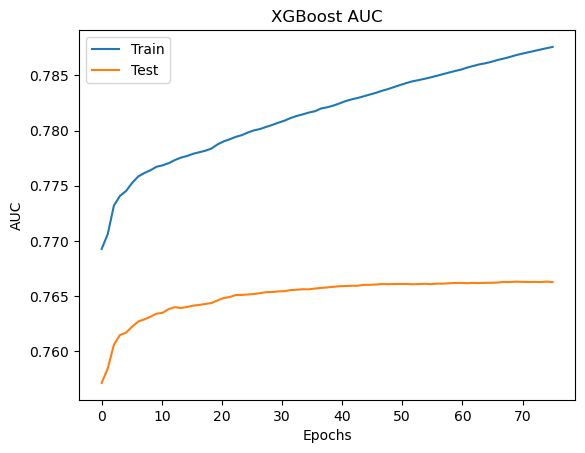

In [209]:
plt.plot(x_axis, results['validation_0']['auc'], label='Train')
plt.plot(x_axis, results['validation_1']['auc'], label='Test')
plt.legend()
plt.ylabel('AUC')
plt.xlabel('Epochs')
plt.title('XGBoost AUC')
plt.show()

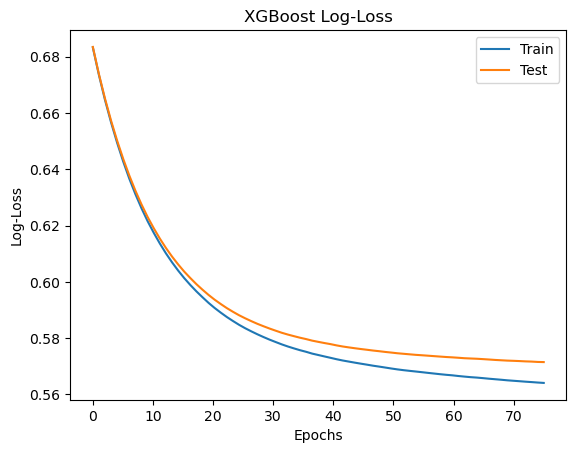

In [210]:
plt.plot(x_axis, results['validation_0']['logloss'], label='Train')
plt.plot(x_axis, results['validation_1']['logloss'], label='Test')
plt.legend()
plt.ylabel('Log-Loss')
plt.xlabel('Epochs')
plt.title('XGBoost Log-Loss')
plt.show()

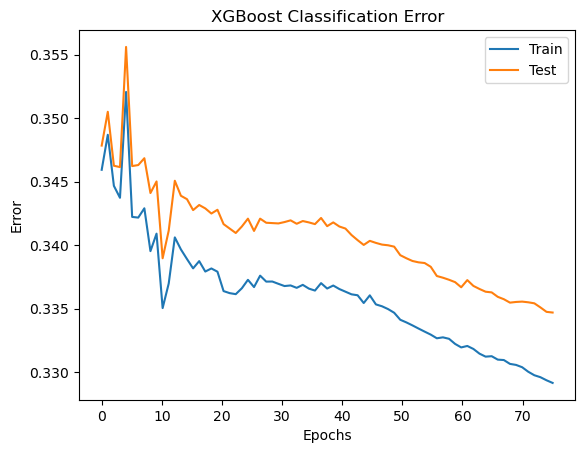

In [211]:
plt.plot(x_axis, results['validation_0']['error'], label='Train')
plt.plot(x_axis, results['validation_1']['error'], label='Test')
plt.legend()
plt.ylabel('Error')
plt.xlabel('Epochs')
plt.title('XGBoost Classification Error')
plt.show()

Extracting and Plotting ROC curve

In [212]:
from sklearn import metrics
def buildROC(target_test, test_preds, target_train, train_preds):
    fpr_test, tpr_test, _ = metrics.roc_curve(target_test, test_preds)
    fpr_train, tpr_train, _ = metrics.roc_curve(target_train, train_preds)
    roc_auc_test = metrics.auc(fpr_test, tpr_test)
    roc_auc_train = metrics.auc(fpr_train, tpr_train)
    plt.title('Receiver Operating Characteristic')
    plt.plot(fpr_test, tpr_test, label = 'Test - AUC = %0.2f' % roc_auc_test, color='g')
    plt.plot(fpr_train, tpr_train, label = 'Train - AUC = %0.2f' % roc_auc_train, color='b')
    plt.legend(loc = 'lower right')
    plt.plot([0, 1], [0, 1],'r--')
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')

In [213]:
y_pred_proba_train = clf.predict_proba(features_train)
y_pred_proba_test = clf.predict_proba(features_test)

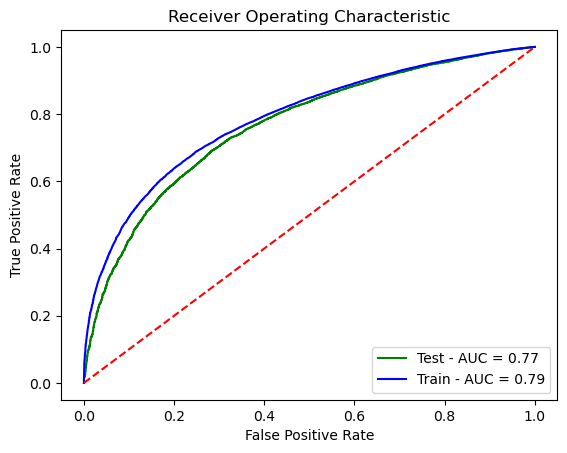

In [214]:
buildROC(targets_test, y_pred_proba_test[:, 1], targets_train, y_pred_proba_train[:, 1])

Feature Importance

In [215]:
def plot_important_features(features, feature_importances_, number):
    
    plt.close()
    plt.figure(figsize=(8,5))
    
    zipped = zip(features, feature_importances_)
    zipped_sort = sorted(zipped, key = lambda x:x[1], reverse=True)
    zipped_sort_reduced = zipped_sort[:number]
    
    res = [[ i for i, j in zipped_sort_reduced], 
           [ j for i, j in zipped_sort_reduced]]
    red_features = res[0]
    red_importances = res[1]
    
    plt.barh(range(len(red_importances)), red_importances, align='center')
    plt.yticks(np.arange(len(red_features)), red_features)
    plt.xlabel("Feature importance")
    plt.ylabel("Top %i features"%(number))
    plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.1)
    plt.tight_layout()
    plt.show()
    
    return red_features

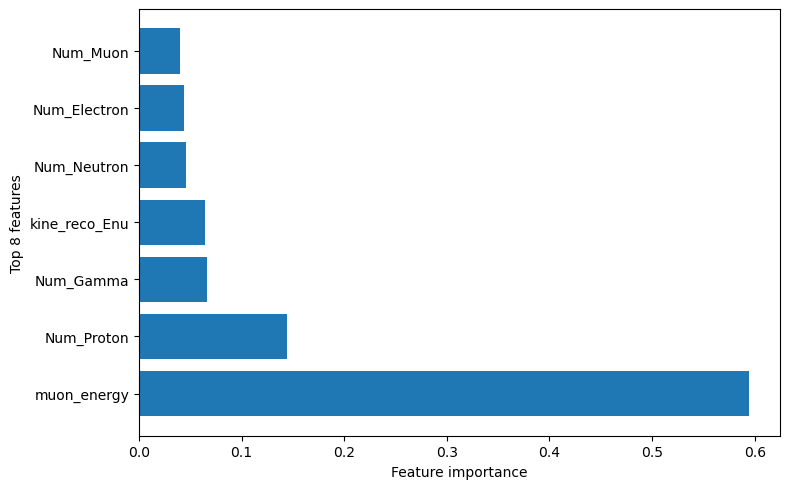

In [216]:
list_features = plot_important_features(training_variables, clf.feature_importances_, 8)

Plot the BDT Score Distribution

In [217]:
# First Calulate BDT score
#df_bdt.loc[:,bdt_score] = clf.predict_proba(df_bdt[training_variables])[:,1]
df_bdt['bdt1_score'] = clf.predict_proba(df_bdt[training_variables])[:,1]

y_pred_proba_sig_train = clf.predict_proba(features_test_sig)
y_pred_proba_bkg_train = clf.predict_proba(features_test_bkg)
bdt1ScoreSigTrain = y_pred_proba_sig_train[:,-1]
bdt1ScoreBkgTrain = y_pred_proba_bkg_train[:,-1]

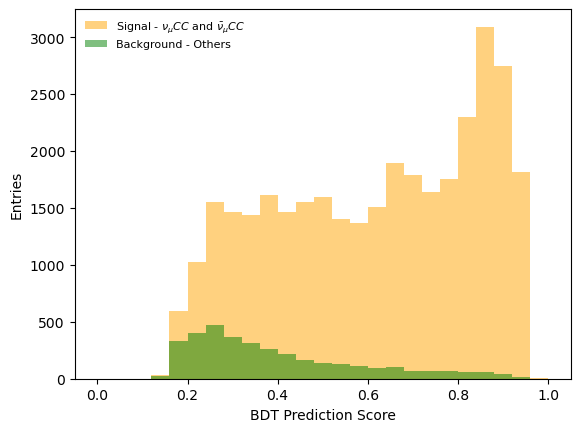

In [218]:
plt.hist(bdt1ScoreSigTrain, 25, color='orange', range=(0.,1.), label=r'Signal - $\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', alpha=0.5, density=False)
plt.hist(bdt1ScoreBkgTrain, 25, color='green', range=(0.,1.), label= r'Background - Others', alpha=0.5, density=False)
plt.xlabel("BDT Prediction Score")
plt.ylabel("Entries")
plt.legend(fontsize=8, loc='best', frameon=False)
plt.show()

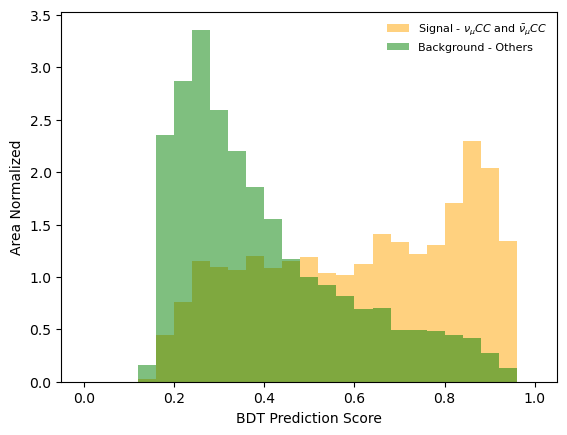

In [219]:
plt.hist(bdt1ScoreSigTrain, 25, color='orange', range=(0.,1.), label=r'Signal - $\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', alpha=0.5, density=True)
plt.hist(bdt1ScoreBkgTrain, 25, color='green', range=(0.,1.), label= r'Background - Others', alpha=0.5, density=True)
plt.xlabel("BDT Prediction Score")
plt.ylabel("Area Normalized")
plt.legend(fontsize=8, loc='best', frameon=False)
plt.show()

In [220]:
cut = 0.6
signal_cut = bdt1ScoreSigTrain[bdt1ScoreSigTrain>=cut]
bkg_cut = bdt1ScoreBkgTrain[bdt1ScoreBkgTrain>=cut]

signal_cut_accuracy = signal_cut.size/(signal_cut.size+bkg_cut.size)
bkg_cut_accuracy = bkg_cut.size/(signal_cut.size+bkg_cut.size)
print("the sig accuracy %.3f and bkg accuracy is %.3f" % (signal_cut_accuracy, bkg_cut_accuracy))
print(signal_cut.size)
print(bkg_cut.size)
print(bdt1ScoreSigTrain.size)

the sig accuracy 0.970 and bkg accuracy is 0.030
18538
583
33652


In [221]:
# plot signal and background separately
# plt.figure();
# plt.hist(predictions[test.get_label().astype(bool)],bins=np.linspace(0,1,50),
#          histtype='step',color='midnightblue',label='signal');
# plt.hist(predictions[~(test.get_label().astype(bool))],bins=np.linspace(0,1,50),
#          histtype='step',color='firebrick',label='background');
# # make the plot readable
# plt.xlabel('Prediction from BDT',fontsize=12);
# plt.ylabel('Events',fontsize=12);
# plt.legend(frameon=False);

Plot the confusion matrix

2620 900 11541 22111


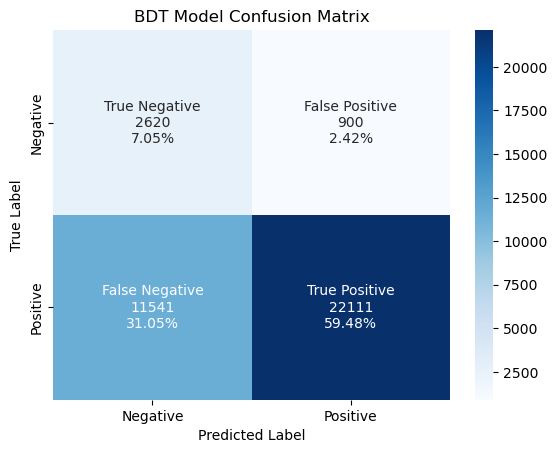

In [222]:
mc_y_pred = clf.predict(features_test)

group_names = ['True Negative', 'False Positive', 'False Negative', 'True Positive']
cm_mc = confusion_matrix(targets_test, mc_y_pred)
test_counts = ["{0:0.0f}".format(value) for value in cm_mc.flatten()]
test_percentage = ["{0:.2%}".format(value) for value in cm_mc.flatten()/np.sum(cm_mc)]
test_labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,test_counts,test_percentage)]
test_labels = np.asarray(test_labels).reshape(2,2)
ax= plt.subplot()
sns.heatmap(cm_mc, annot=test_labels, fmt='', cmap='Blues', ax=ax);
tn, fp, fn, tp = cm_mc.ravel()
print(tn, fp, fn, tp)
# labels, title and ticks

ax.set_title('BDT Model Confusion Matrix'); 
ax.set_xlabel("Predicted Label")
ax.set_ylabel("True Label")
ax.xaxis.set_ticklabels(['Negative', 'Positive']); 
ax.yaxis.set_ticklabels(['Negative', 'Positive']);

## Plotting Particle Multiplicity

In [223]:
# First set a mask for plotting multiplicity
df_numucc = df_bdt.query('bdt_numucc_label==1')
df_numubar = df_bdt.query('bdt_numubarcc_label==1')
df_numu_all = df_bdt.query('bdt_numu_all_label==1')
df_others = df_bdt.query('bdt_others_label==1')

In [224]:
df_bdt.head()

,kine_reco_Enu,kine_pio_mass,kine_pio_flag,kine_pio_vtx_dis,kine_pio_energy_1,kine_pio_energy_2,kine_pio_dis_1,kine_pio_dis_2,kine_pio_angle,numu_cc_flag,...,Num_Proton,Num_Gamma,Num_Electron,Num_Pion,RSE,bdt_numu_all_label,bdt_others_label,bdt_numubarcc_label,bdt_numucc_label,bdt1_score
0,519.828857,40.981392,1,108.913315,36.602570,14.000175,0.000000,82.167252,158.470398,1.0,...,0.0,4.0,1.0,0.0,14121_122_6119,1,0,1,0,0.545574
5,179.307251,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,2.0,2.0,0.0,14121_215_10756,0,1,0,0,0.150499
8,1554.589478,97.067871,1,0.000000,5.853202,592.542969,34.231270,250.054977,110.998123,1.0,...,1.0,4.0,0.0,0.0,14121_215_10795,1,0,1,0,0.751799
10,598.605408,4.930235,1,0.000000,45.465714,69.135605,190.499268,199.879242,5.040080,1.0,...,0.0,2.0,1.0,0.0,14121_223_11152,1,0,1,0,0.213067
12,408.178436,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,2.0,0.0,0.0,14121_223_11167,1,0,0,1,0.500860


/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3197906198.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3197906198.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



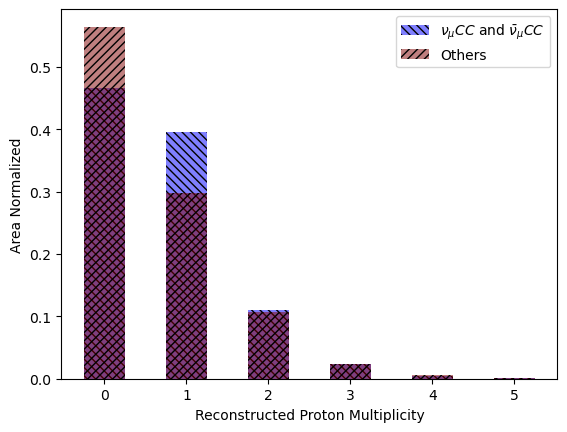

In [225]:
plt.hist(df_numu_all['Num_Proton'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_others['Num_Proton'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='maroon',hatch='////')
#plt.hist(df_others['Num_Proton'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Proton Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/2685264027.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/2685264027.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



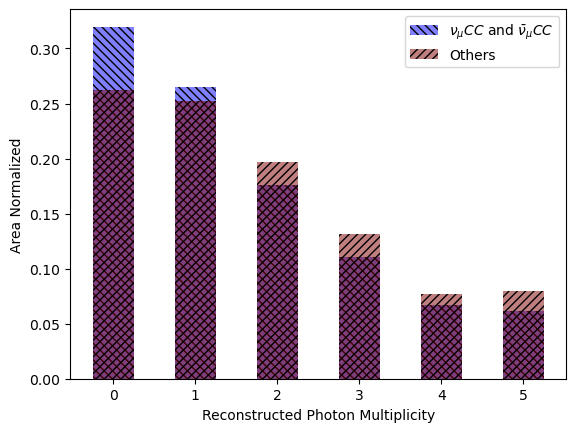

In [226]:
plt.hist(df_numu_all['Num_Gamma'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_others['Num_Gamma'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='maroon',hatch='////')
#plt.hist(df_others['Num_Gamma'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Photon Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/2306354865.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/2306354865.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



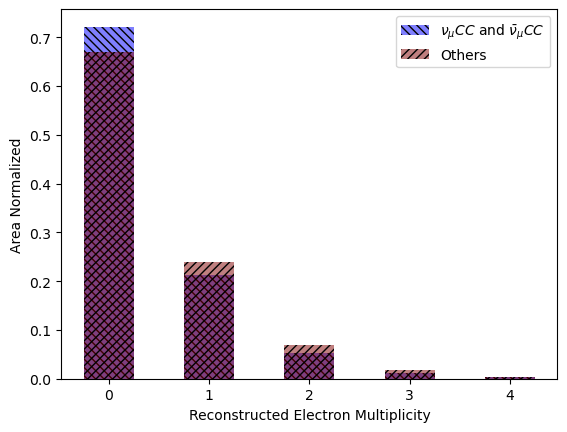

In [227]:
plt.hist(df_numu_all['Num_Electron'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_others['Num_Electron'], 5, (0,5), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
#plt.hist(df_others['Num_Electron'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Electron Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3618433897.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3618433897.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



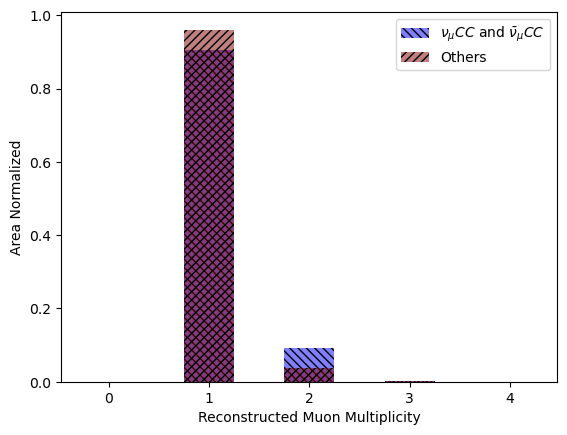

In [228]:
plt.hist(df_numu_all['Num_Muon'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_others['Num_Muon'], 5, (0,5), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
#plt.hist(df_others['Num_Muon'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Muon Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3946418947.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3946418947.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



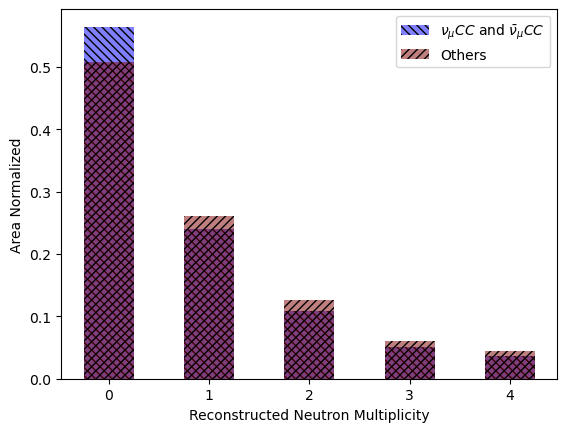

In [229]:
plt.hist(df_numu_all['Num_Neutron'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_others['Num_Neutron'], 5, (0,5), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
#plt.hist(df_others['Num_Neutron'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Neutron Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3765199722.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3765199722.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



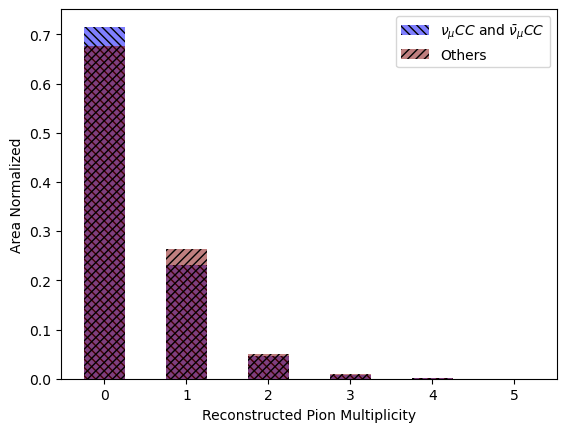

In [230]:
plt.hist(df_numu_all['Num_Pion'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_others['Num_Pion'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
#plt.hist(df_others['Num_Pion'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Pion Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1279740162.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1279740162.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



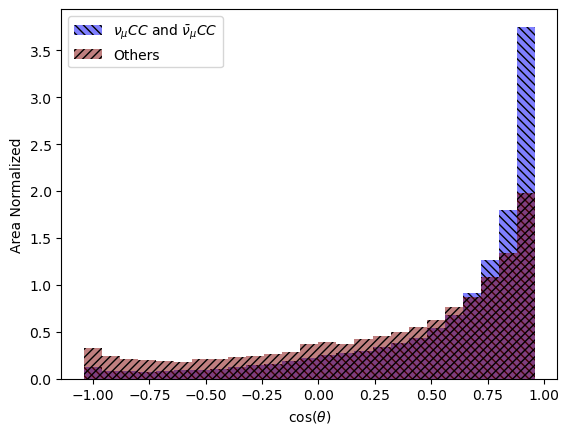

In [231]:
plt.hist(df_numu_all['cos_theta'], 25, (-1,1), density=True, label=r'$\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_others['cos_theta'], 25, (-1,1), density=True, label= r'Others', align='left', alpha=.5, color='maroon',hatch='////')
#plt.hist(df_others['cos_theta'], 25, (-1,1), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel(r"cos($\theta$)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

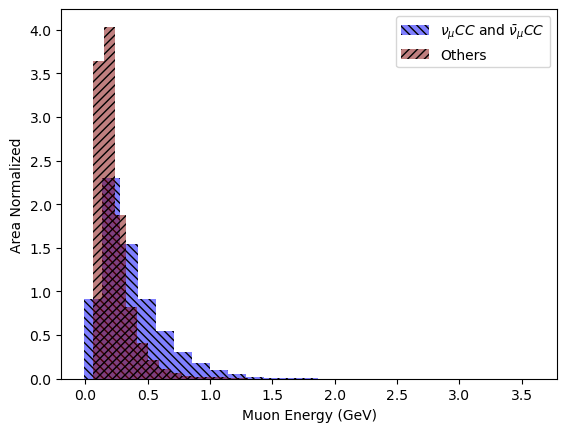

In [232]:
plt.hist(df_numu_all['muon_energy'], 25, density=True, label=r'$\nu_{\mu}CC$ and $\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_others['muon_energy'], 25, density=True, label= r'Others', align='left', alpha=.5, color='maroon',hatch='////')
#plt.hist(df_others['cos_theta'], 25, (-1,1), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel(r"Muon Energy (GeV)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

### **Applying the MC-trained BDT onto other samples (specifically data)**

In [233]:
# use our model prediction on all the other samples
df_mc.loc[:,'bdt1_score'] = clf.predict_proba(df_mc[training_variables])[:,1]
df_ext.loc[:,'bdt1_score'] = clf.predict_proba(df_ext[training_variables])[:,1]
df_dirt.loc[:,'bdt1_score'] = clf.predict_proba(df_dirt[training_variables])[:,1]
df_beam_on.loc[:,'bdt1_score'] = clf.predict_proba(df_beam_on[training_variables])[:,1]

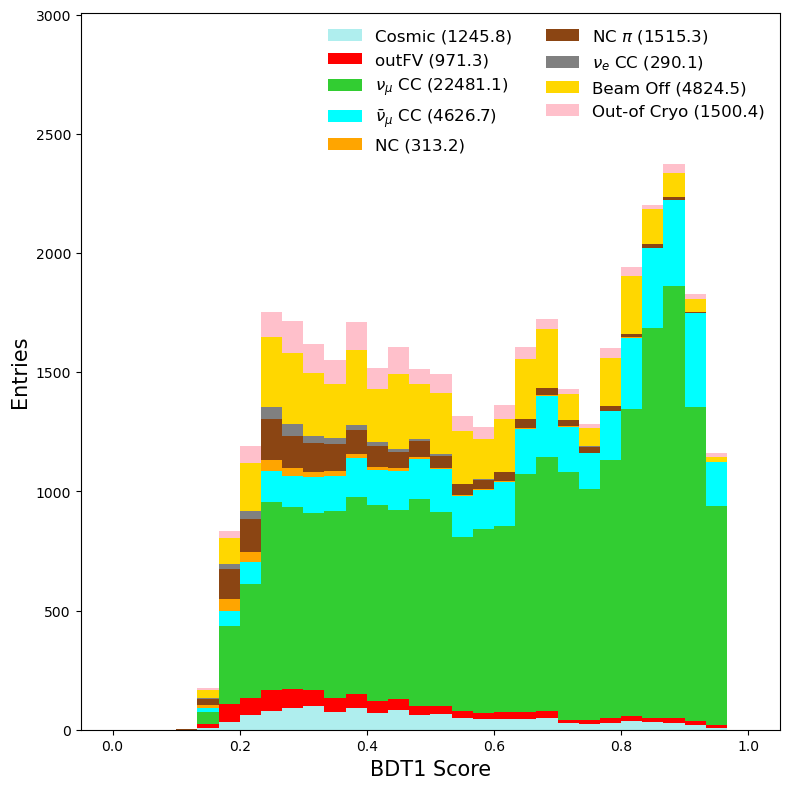

In [234]:
mc_data_stacked_hist(df_beam_on, df_ext, df_mc, df_dirt, 'bdt1_score', 'weight_ubtune', \
                        "plots/%s_bdt1_score" % "bdtScore", r"BDT1 Score",\
                        0., 1., 30, pot_data=run3b_pot_beam_on)

### **For our BDT model, plot out the efficiency and purity of our signal**

In [235]:
from scipy.interpolate import interp1d
from scipy.optimize import fsolve

In [236]:
def plot_eff_purity(df,):
    step = .01 

    bdt_var_min = 0 
    bdt_var_max = .91

    # create the efficiency, purity and both arrays
    h_eff = []
    h_eff_x = []
    h_pur = []
    h_pur_x = []
    h_multi = [] 
    h_multi_x = []

    # loop over bdt var, from 0 to 1 in steps 
    var = bdt_var_min
    while(var <= bdt_var_max):

        # calculate BDT model efficiency
        df_eff_num = df[(df.truth_nuPdg==-14) &
                        (df.truth_isCC==1) &
                        (df.truth_vtxInside==1) &
                        (df.bdt1_score>var)]
        df_eff_num = gen_nu_selec(df_eff_num)

        df_eff_den = df[(df.truth_nuPdg==-14) &
                        (df.truth_isCC==1) &
                        (df.truth_vtxInside==1)]
        
        if(len(df_eff_den)!=0):
            h_eff.append((len(df_eff_num)/len(df_eff_den)))
            h_eff_x.append(var)

        # find which bdt score point does efficiency drops to zero
        closest_x = min(h_eff_x, key=lambda x: abs(0 - h_eff[h_eff_x.index(x)]))
        x_filter_range = (0, closest_x)
        
        # Now calculate purity
        df_pur_num = df[(df.truth_nuPdg==-14) &
                        (df.truth_isCC==1) &
                        (df.truth_vtxInside==1) &
                        (df.bdt1_score>var)]
        #df_pur_num = gen_nu_selec(df_pur_num)

        df_pur_den = df[df.bdt1_score>var]

        if(len(df_pur_den)!=0):
            h_pur.append((len(df_pur_num)/len(df_pur_den)))
            h_pur_x.append(var)

        # Finally, calculate purity times efficiency
           
        purity = -999
        efficiency = -999

        if(len(df_pur_den)!=0):
            purity = len(df_pur_num)/len(df_pur_den)
        if(len(df_eff_den)!=0):
            efficiency = len(df_pur_num)/len(df_eff_den)

        if((purity!=-999) & (efficiency!=-999)):
            h_multi.append((purity*efficiency))
            h_multi_x.append(var)

        # update to next step
        var += step

    closest_x = min(h_eff_x, key=lambda x: abs(0 - h_eff[h_eff_x.index(x)]))
    x_filter_range = (0, closest_x)
    # filtered_x_pur = [x for x in h_pur_x if x_filter_range[0] <= x <= x_filter_range[1]]
    # filtered_y_pur = [h_pur[h_pur_x.index(x)] for x in filtered_x_pur]
    
    #find the intersection 
    # Interpolate the data
    f1 = interp1d(h_eff_x, h_eff, kind='linear', fill_value='extrapolate')
    f2 = interp1d(h_pur_x, h_pur, kind='linear', fill_value='extrapolate')

    # Define the function representing the difference between the two interpolated functions
    def equation_to_solve(x):
        return f1(x) - f2(x)

    # Guess initial intersection points based on the input data range
    initial_guess = np.linspace(min(min(h_eff_x), min(h_pur_x)), max(max(h_eff_x), max(h_pur_x)), 10)


    # Use fsolve to find the roots (intersection points)
    intersection_points = fsolve(equation_to_solve, initial_guess)

    # plotting section
    plt.plot(h_eff_x, h_eff, c="green", label="Efficiency")
    plt.plot(h_pur_x, h_pur, c="purple", label="Purity")
    plt.plot(h_multi_x, h_multi, ls="-.", c="red", label=r"Eff. $\times$ Pur.")
    plt.scatter(intersection_points, f1(intersection_points), color='red')
    #plt.vlines(intersection_points[0], 0., 100., colors="blue", ls="--", label=("Optimal BDT Score Cut - %.3f" % intersection_points[0]))
    plt.xlim([0,1.])
    plt.ylim([0,1.1])
    plt.title(r"BDT Model $\bar{\nu}_{\mu}$ Selection Efficiency & Purity Across BDT Score Thresholds")
    plt.xlabel("BDT Score")
    plt.ylabel(r"Density")
    plt.legend(loc="best")
    plt.tight_layout()
    plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1624732925.py:87: RuntimeWarning:

The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.



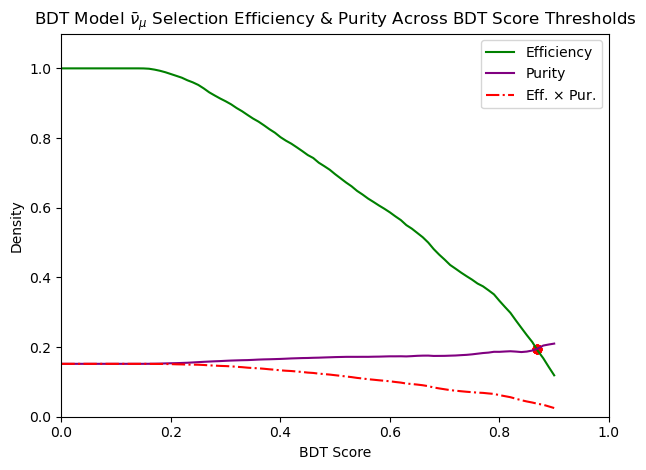

In [237]:
plot_eff_purity(df_bdt)


## BDT 2

This section of new BDT follows the previous result, cut on the BDT and then proceeds to isolate between numubarCC and numuCC

In [238]:
df_mc

,kine_reco_Enu,kine_pio_mass,kine_pio_flag,kine_pio_vtx_dis,kine_pio_energy_1,kine_pio_energy_2,kine_pio_dis_1,kine_pio_dis_2,kine_pio_angle,numu_cc_flag,...,Num_Proton,Num_Gamma,Num_Electron,Num_Pion,RSE,bdt_numu_all_label,bdt_others_label,bdt_numubarcc_label,bdt_numucc_label,bdt1_score
0,519.828857,40.981392,1,108.913315,36.602570,14.000175,0.000000,82.167252,158.470398,1.0,...,0.0,4.0,1.0,0.0,14121_122_6119,1,0,1,0,0.545574
5,179.307251,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,2.0,2.0,0.0,14121_215_10756,0,1,0,0,0.150499
8,1554.589478,97.067871,1,0.000000,5.853202,592.542969,34.231270,250.054977,110.998123,1.0,...,1.0,4.0,0.0,0.0,14121_215_10795,1,0,1,0,0.751799
10,598.605408,4.930235,1,0.000000,45.465714,69.135605,190.499268,199.879242,5.040080,1.0,...,0.0,2.0,1.0,0.0,14121_223_11152,1,0,1,0,0.213067
12,408.178436,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,2.0,0.0,0.0,14121_223_11167,1,0,0,1,0.500860
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1015421,1500.751343,7.909132,1,0.000000,14.603396,12.697556,0.000000,83.705704,28.913725,1.0,...,0.0,3.0,1.0,1.0,18044_40_2020,1,0,0,1,0.472928
1015426,446.652527,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,1.0,0.0,1.0,0.0,18044_40_2037,1,0,1,0,0.420924
1015437,976.994202,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,1.0,1.0,0.0,0.0,18044_109_5489,1,0,0,1,0.954089
1015439,780.835632,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,4.0,0.0,1.0,18044_109_5498,1,0,0,1,0.178350


In [239]:
df_mc_bdt1 = df_mc[df_mc.bdt1_score >= 0.25]

In [240]:
df_mc_bdt1

,kine_reco_Enu,kine_pio_mass,kine_pio_flag,kine_pio_vtx_dis,kine_pio_energy_1,kine_pio_energy_2,kine_pio_dis_1,kine_pio_dis_2,kine_pio_angle,numu_cc_flag,...,Num_Proton,Num_Gamma,Num_Electron,Num_Pion,RSE,bdt_numu_all_label,bdt_others_label,bdt_numubarcc_label,bdt_numucc_label,bdt1_score
0,519.828857,40.981392,1,108.913315,36.602570,14.000175,0.000000,82.167252,158.470398,1.0,...,0.0,4.0,1.0,0.0,14121_122_6119,1,0,1,0,0.545574
8,1554.589478,97.067871,1,0.000000,5.853202,592.542969,34.231270,250.054977,110.998123,1.0,...,1.0,4.0,0.0,0.0,14121_215_10795,1,0,1,0,0.751799
12,408.178436,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,2.0,0.0,0.0,14121_223_11167,1,0,0,1,0.500860
18,1050.149658,46.026836,1,0.000000,6.234710,95.852417,346.280334,127.390831,140.574005,1.0,...,1.0,2.0,0.0,0.0,14146_3_157,1,0,0,1,0.916939
21,1119.397217,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,2.0,1.0,1.0,14146_3_162,0,1,0,0,0.421371
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1015414,1322.388306,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,0.0,0.0,0.0,0.0,18044_40_2006,1,0,0,1,0.927156
1015421,1500.751343,7.909132,1,0.000000,14.603396,12.697556,0.000000,83.705704,28.913725,1.0,...,0.0,3.0,1.0,1.0,18044_40_2020,1,0,0,1,0.472928
1015426,446.652527,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,1.0,0.0,1.0,0.0,18044_40_2037,1,0,1,0,0.420924
1015437,976.994202,0.000000,0,1000.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,...,1.0,1.0,0.0,0.0,18044_109_5489,1,0,0,1,0.954089


In [241]:
# Rename dataframe, allowing df_bdt to be other things in the future
df_bdt2 = df_mc_bdt1

# Label the sample provided, include "bdt_numubarcc_label" and "bdt_numucc_label"
#label_signal(df_bdt2)

# Remove remaining background (everything different than numuCC/numubarCC)
# remove_background_events(df_bdt)

# Calculate extra variables
#calc_vertex_dist(df_bdt)
#calc_costheta(df_bdt)

# ============================

chosen_var2 = 'bdt_numubarcc_label' # numubarCC=signal, numuCC = bkg

# ============================

# List of variables used for training
training_variables2 = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron'
                       , 'kine_reco_Enu','cos_theta']
#training_variables2 = ['Num_Proton', 'Num_Neutron', 'Num_Gamma', 'Num_Muon', 'Num_Electron','cos_theta', 'muon_energy']

# Split the dataset into training and validation sets - using random_state as handle on the randomness of data
features2 = df_bdt2[training_variables2]
targets2 = df_bdt2[chosen_var2]

# Compute sample weights to balance the class distribution
sample_weights2 = compute_sample_weight(class_weight="balanced", y=targets2)
features_train2, features_test2, targets_train2, targets_test2, sample_weights_train2, sample_weights_test2 = train_test_split(features2, targets2, sample_weights2, test_size=0.2, random_state=0)

features_test_sig2 = features_test2[targets_test2==1]
features_test_bkg2 = features_test2[targets_test2==0]

#Calculate the scale by which to increase the gradient for minority class examples
#scale = minority_gradient_scaler(df_bdt.copy())
#scale = 1
#print('Scaling minority class events by factor = %.2e' % scale)


In [242]:
lock4 = False
if lock4==True:
    xgb_dic={
        'n_estimators':[50,75,100,200,300,500],
        'max_depth': [3,4,5,6,7,10],
        'eta': [0.01,0.05,0.1,0.5]
        }

    # Deine BDT object
    xgb_classifier = xgb.XGBClassifier()

    grid = GridSearchCV(xgb_classifier, xgb_dic, n_jobs=5)
    grid.fit(features_train2, targets_train2)

    print(f"The best score is \t{grid.best_score_}")
    print(f"The best parameters are \t{grid.best_params_}")

    results = pd.DataFrame.from_dict(grid.cv_results_)

In [243]:
# Create an XGBoost classifier (we should play with these parameters)
clf2 = xgb.XGBClassifier(n_estimators=100, # non 100, FC 300, PC 300
                        eta=0.1, # non 0.1, FC 0.05, PC 0.05
                        max_depth=4, # non 5 FC 3, PC 3
                        scale_pos_weight=1, 
                        eval_metric=["error","auc", "logloss"],
                        objective = 'binary:logistic',
                        use_label_encoder=False # removes warning
                       )

# Train the classifier on our newly constructed dataset
eval_set2 = [(features_train2, targets_train2), (features_test2, targets_test2)]
clf2.fit(features_train2, targets_train2, sample_weight=sample_weights_train2, eval_set=eval_set2)

[0]	validation_0-error:0.35287	validation_0-auc:0.72370	validation_0-logloss:0.67840	validation_1-error:0.35039	validation_1-auc:0.72484	validation_1-logloss:0.67812
[1]	validation_0-error:0.34925	validation_0-auc:0.72651	validation_0-logloss:0.66628	validation_1-error:0.34625	validation_1-auc:0.72800	validation_1-logloss:0.66567
[2]	validation_0-error:0.34925	validation_0-auc:0.72961	validation_0-logloss:0.65618	validation_1-error:0.34625	validation_1-auc:0.73019	validation_1-logloss:0.65544
[3]	validation_0-error:0.33822	validation_0-auc:0.73179	validation_0-logloss:0.64780	validation_1-error:0.33718	validation_1-auc:0.73176	validation_1-logloss:0.64687
[4]	validation_0-error:0.33922	validation_0-auc:0.73353	validation_0-logloss:0.64079	validation_1-error:0.33797	validation_1-auc:0.73369	validation_1-logloss:0.63978
[5]	validation_0-error:0.33440	validation_0-auc:0.73545	validation_0-logloss:0.63479	validation_1-error:0.33342	validation_1-auc:0.73532	validation_1-logloss:0.63369
[6]	

/opt/anaconda3/envs/numu_xsec/lib/python3.11/site-packages/xgboost/core.py:158: UserWarning:

[13:11:55] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1737531366101/work/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




[10]	validation_0-error:0.32077	validation_0-auc:0.73848	validation_0-logloss:0.61582	validation_1-error:0.31969	validation_1-auc:0.73853	validation_1-logloss:0.61427
[11]	validation_0-error:0.31257	validation_0-auc:0.73908	validation_0-logloss:0.61350	validation_1-error:0.31237	validation_1-auc:0.73905	validation_1-logloss:0.61184
[12]	validation_0-error:0.31181	validation_0-auc:0.73983	validation_0-logloss:0.61145	validation_1-error:0.31153	validation_1-auc:0.73963	validation_1-logloss:0.60975
[13]	validation_0-error:0.31340	validation_0-auc:0.74013	validation_0-logloss:0.60970	validation_1-error:0.31374	validation_1-auc:0.73981	validation_1-logloss:0.60795
[14]	validation_0-error:0.31237	validation_0-auc:0.74044	validation_0-logloss:0.60825	validation_1-error:0.31281	validation_1-auc:0.74020	validation_1-logloss:0.60644
[15]	validation_0-error:0.31310	validation_0-auc:0.74103	validation_0-logloss:0.60690	validation_1-error:0.31398	validation_1-auc:0.74072	validation_1-logloss:0.6050

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eta=0.1,
              eval_metric=['error', 'auc', 'logloss'], feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=4, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_tree=None, ...)

In [244]:
# Get the relevant information for printing

results2 = clf2.evals_result()
epochs2 = len(results2['validation_0']['error'])
x_axis2 = np.linspace(0, epochs2, 100, endpoint=True)

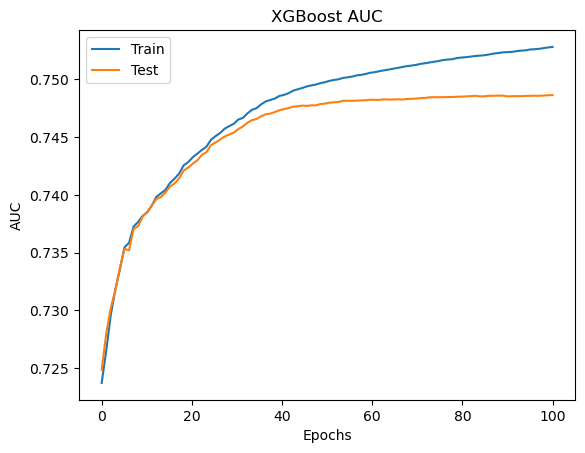

In [245]:
plt.plot(x_axis2, results2['validation_0']['auc'], label='Train')
plt.plot(x_axis2, results2['validation_1']['auc'], label='Test')
plt.legend()
plt.ylabel('AUC')
plt.xlabel('Epochs')
plt.title('XGBoost AUC')
plt.show()

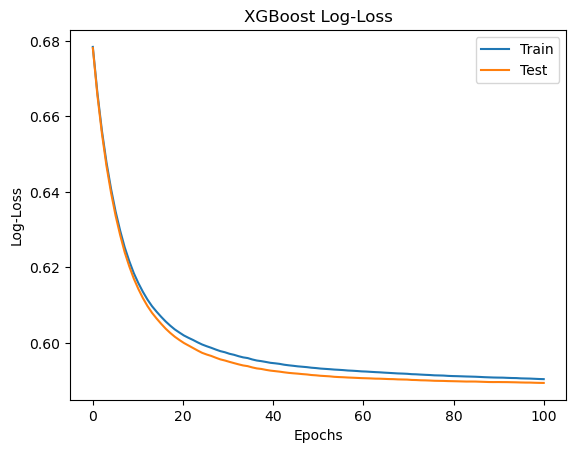

In [246]:
plt.plot(x_axis2, results2['validation_0']['logloss'], label='Train')
plt.plot(x_axis2, results2['validation_1']['logloss'], label='Test')
plt.legend()
plt.ylabel('Log-Loss')
plt.xlabel('Epochs')
plt.title('XGBoost Log-Loss')
plt.show()

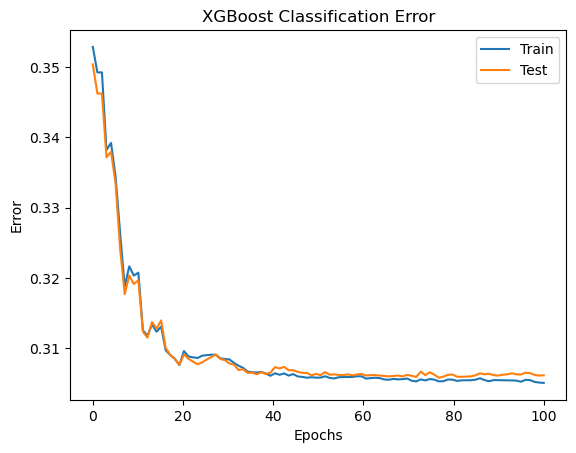

In [247]:
plt.plot(x_axis2, results2['validation_0']['error'], label='Train')
plt.plot(x_axis2, results2['validation_1']['error'], label='Test')
plt.legend()
plt.ylabel('Error')
plt.xlabel('Epochs')
plt.title('XGBoost Classification Error')
plt.show()

In [248]:
y_pred_proba_train2 = clf2.predict_proba(features_train2)
y_pred_proba_test2 = clf2.predict_proba(features_test2)

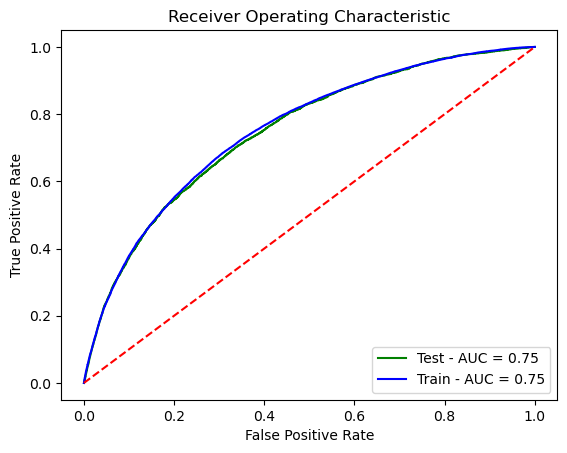

In [249]:
buildROC(targets_test2, y_pred_proba_test2[:, 1], targets_train2, y_pred_proba_train2[:, 1])

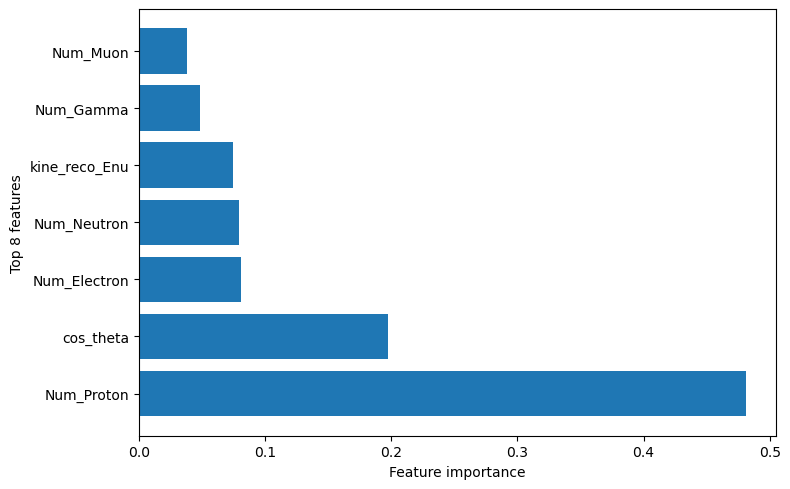

In [250]:
list_features = plot_important_features(training_variables2, clf2.feature_importances_, 8)

In [251]:
# First Calulate BDT score
#df_bdt.loc[:,bdt_score] = clf.predict_proba(df_bdt[training_variables])[:,1]
df_bdt2['bdt2_score'] = clf2.predict_proba(df_bdt2[training_variables2])[:,1]

y_pred_proba_sig_train2 = clf2.predict_proba(features_test_sig2)
y_pred_proba_bkg_train2 = clf2.predict_proba(features_test_bkg2)
bdt2ScoreSigTrain = y_pred_proba_sig_train2[:,-1]
bdt2ScoreBkgTrain = y_pred_proba_bkg_train2[:,-1]

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/2797417199.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



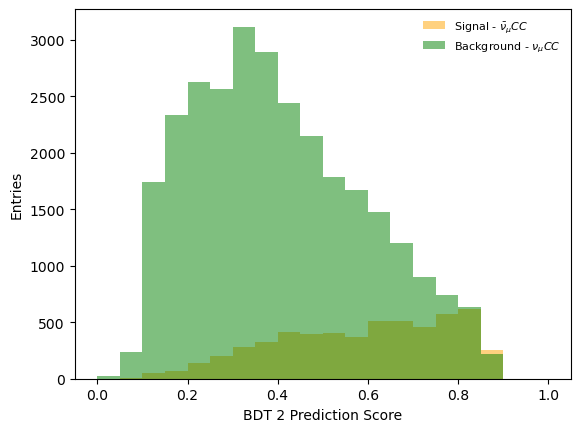

In [252]:
plt.hist(bdt2ScoreSigTrain, 20, color='orange', range=(0.,1.), label=r'Signal - $\bar{\nu}_{\mu}CC$', alpha=0.5, density=False)
plt.hist(bdt2ScoreBkgTrain, 20, color='green', range=(0.,1.), label= r'Background - $\nu_{\mu}CC$', alpha=0.5, density=False)
plt.xlabel("BDT 2 Prediction Score")
plt.ylabel("Entries")
plt.legend(fontsize=8, loc='best', frameon=False)
plt.show()

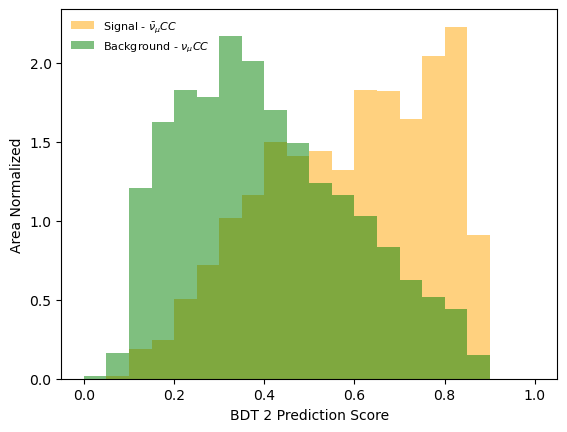

In [253]:
plt.hist(bdt2ScoreSigTrain, 20, color='orange', range=(0.,1.), label=r'Signal - $\bar{\nu}_{\mu}CC$', alpha=0.5, density=True)
plt.hist(bdt2ScoreBkgTrain, 20, color='green', range=(0.,1.), label= r'Background - $\nu_{\mu}CC$', alpha=0.5, density=True)
plt.xlabel("BDT 2 Prediction Score")
plt.ylabel("Area Normalized")
plt.legend(fontsize=8, loc='best', frameon=False)
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3049517114.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3049517114.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3049517114.py:3: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



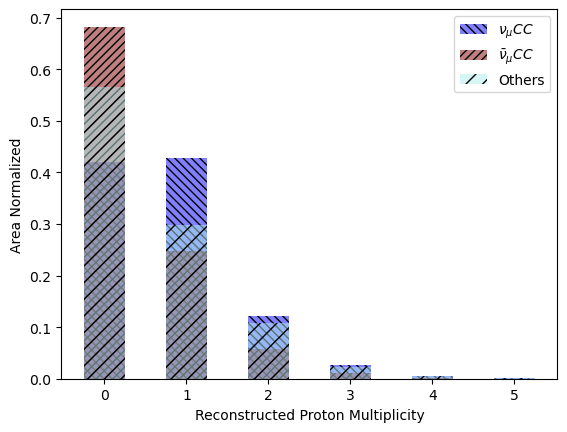

In [254]:
plt.hist(df_numucc['Num_Proton'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Proton'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['Num_Proton'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Proton Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/279634887.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/279634887.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/279634887.py:3: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



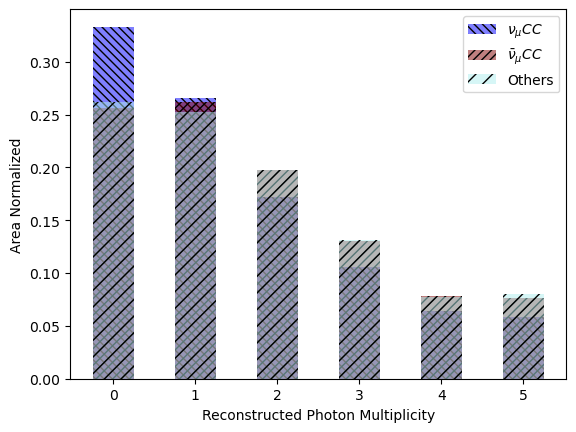

In [255]:
plt.hist(df_numucc['Num_Gamma'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Gamma'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['Num_Gamma'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Photon Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/327151371.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/327151371.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/327151371.py:3: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



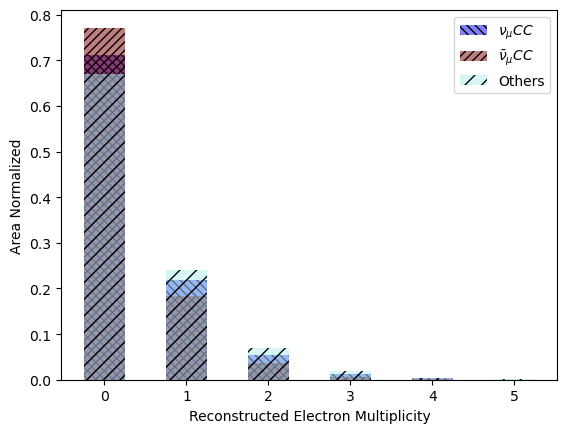

In [256]:
plt.hist(df_numucc['Num_Electron'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Electron'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
plt.hist(df_others['Num_Electron'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Electron Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1850962600.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1850962600.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1850962600.py:3: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



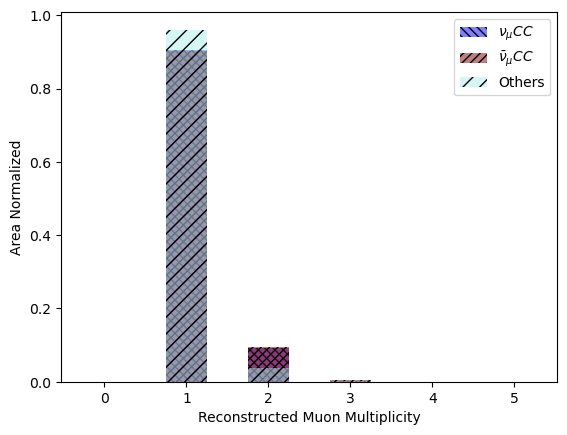

In [257]:
plt.hist(df_numucc['Num_Muon'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Muon'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
plt.hist(df_others['Num_Muon'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Muon Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1704111924.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1704111924.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1704111924.py:3: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



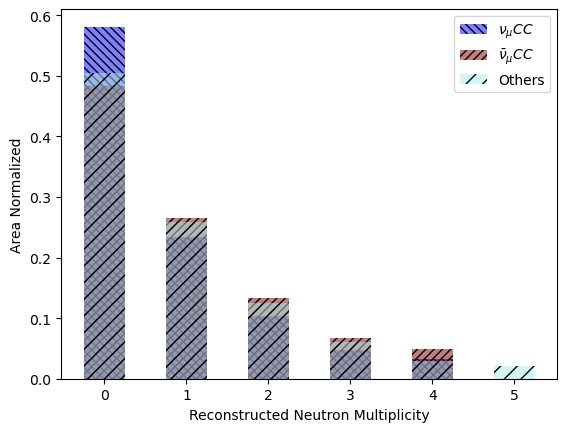

In [258]:
plt.hist(df_numucc['Num_Neutron'], 5, (0,5), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Neutron'], 5, (0,5), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
plt.hist(df_others['Num_Neutron'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Neutron Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/2143412985.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/2143412985.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/2143412985.py:3: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



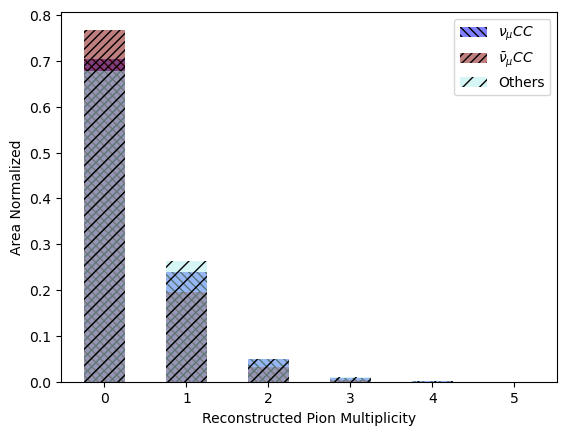

In [259]:
plt.hist(df_numucc['Num_Pion'], 6, (0,6), density=True, label=r'$\nu_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='blue', hatch='\\\\\\\\')
plt.hist(df_numubar['Num_Pion'], 6, (0,6), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', rwidth=0.5, alpha=.5, color='maroon', hatch='////')
plt.hist(df_others['Num_Pion'], 6, (0,6), density=True, label= r'Others', align='left', rwidth=0.5, alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel("Reconstructed Pion Multiplicity")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3470418256.py:1: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3470418256.py:2: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/3470418256.py:3: MatplotlibDeprecationWarning:

Passing the range parameter of hist() positionally is deprecated since Matplotlib 3.9; the parameter will become keyword-only in 3.11.



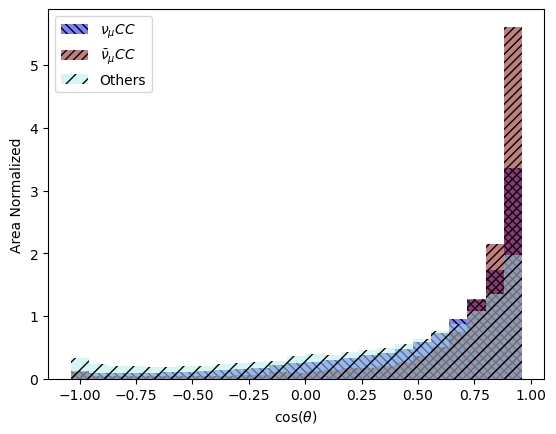

In [260]:
plt.hist(df_numucc['cos_theta'], 25, (-1,1), density=True, label=r'$\nu_{\mu}CC$', align='left', alpha=.5, color='blue',hatch='\\\\\\\\')
plt.hist(df_numubar['cos_theta'], 25, (-1,1), density=True, label= r'$\bar{\nu}_{\mu}CC$', align='left', alpha=.5, color='maroon',hatch='////')
plt.hist(df_others['cos_theta'], 25, (-1,1), density=True, label= r'Others', align='left', alpha=.5, color='paleturquoise',hatch='//')
plt.xlabel(r"cos($\theta$)")
plt.ylabel("Area Normalized")
plt.legend()
plt.show()

## Plotting Proton Multiplicity and Scattering Angle Distribution

For numuCC label

In [261]:
fig = px.density_heatmap(df_numucc, x="cos_theta", y="Num_Proton", text_auto=False,
                         labels={"Num_Proton": "Proton Multiplicity", "cos_theta": "cos (theta)"},
                         marginal_x="histogram", marginal_y="histogram", title="numuCC proton multiplicity vs scattering angle",
                         range_x=(0.2,1.02), range_y=(-.2,3.), nbinsx=50, nbinsy=15)
fig.show()

In [262]:
fig = px.density_heatmap(df_numubar, x="cos_theta", y="Num_Proton", text_auto=False, 
                         labels={"Num_Proton": "Proton Multiplicity", "cos_theta": "cos(theta)"},
                         marginal_x="histogram", marginal_y="histogram", title="numubarCC proton multiplicity vs scattering angle",
                         range_x=(0.4,1.02), range_y=(-0.5,3.), nbinsx=50, nbinsy=10)
fig.show()

In [263]:
# use our model prediction on all the other samples
df_mc.loc[:,'bdt2_score'] = clf.predict_proba(df_mc[training_variables])[:,1]
df_ext.loc[:,'bdt2_score'] = clf.predict_proba(df_ext[training_variables])[:,1]
df_dirt.loc[:,'bdt2_score'] = clf.predict_proba(df_dirt[training_variables])[:,1]
df_beam_on.loc[:,'bdt2_score'] = clf.predict_proba(df_beam_on[training_variables])[:,1]

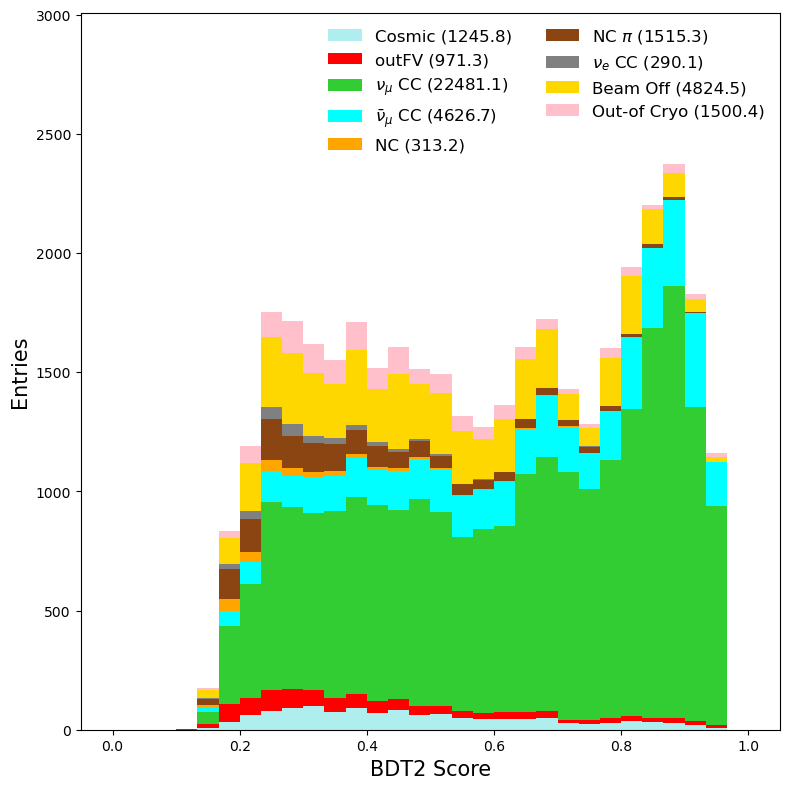

In [264]:
mc_data_stacked_hist(df_beam_on, df_ext, df_mc, df_dirt, 'bdt1_score', 'weight_ubtune', \
                        "plots/%s_bdt1_score" % "bdtScore", r"BDT2 Score",\
                        0., 1., 30, pot_data=run3b_pot_beam_on)

/var/folders/61/z_mpdl8x31dcjrks2m91kynw0000gp/T/ipykernel_54586/1624732925.py:87: RuntimeWarning:

The iteration is not making good progress, as measured by the 
 improvement from the last ten iterations.



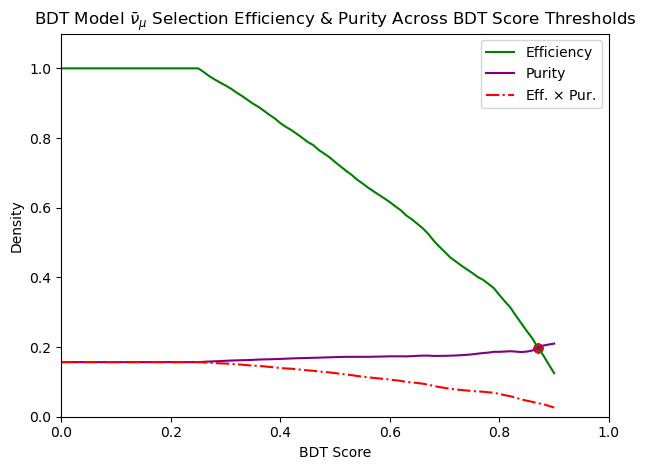

In [265]:
plot_eff_purity(df_bdt2)
